Loading Dataset

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("aliredaelblgihy/social-media-engagement-report")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\haadh\.cache\kagglehub\datasets\aliredaelblgihy\social-media-engagement-report\versions\1


Displaying first few rows to get an initial overview

In [3]:
import pandas as pd
data = pd.read_excel(path + "/social_media_engagement_data.xlsx")
data.head()

,Platform,Post ID,Post Type,Post Content,Post Timestamp,Likes,Comments,Shares,Impressions,Reach,Engagement Rate,Audience Age,Audience Gender,Audience Location,Audience Interests,Campaign ID,Sentiment,Influencer ID
0,LinkedIn,d49dadb4-fc1e-4775-88ad-d60b75cf5123,Video,Want that according same wish.,2021-04-23 08:19:49.255,415,77,85,2619,1842,31.32,29,Other,United Kingdom,respond,NaN,Negative,NaN
1,Instagram,16ce29c5-2dc7-478f-9814-a86754f3ce8b,Video,Increase fast partner south.,2023-07-30 06:40:06.356,908,125,85,1223,3884,28.78,48,Male,Greece,population,NaN,Neutral,NaN
2,Instagram,6a6cc741-72f4-4111-95a0-c5ee04a175a8,Video,Lawyer behavior born window couple sister.,2021-12-05 03:56:53.212,412,419,58,2165,849,104.71,55,Male,United States Virgin Islands,himself,NaN,Neutral,NaN
3,Twitter,0b5a3e70-c556-43cb-ad4f-a1d0003348bc,Image,Street great decade must.,2021-09-28 20:39:00.228,667,153,29,7191,3519,24.13,54,Other,Zambia,safe,NaN,NaN,NaN
4,Facebook,a7d3e958-e2fe-411e-a24a-b96e821fc050,Link,At clear meeting with reason ground continue c...,2023-02-27 17:51:21.425,659,215,34,3312,2032,44.69,33,Other,Afghanistan,well,6052b8d2-3403-4447-b0b4-c5ce20e6c8d0,NaN,NaN


Examining the dataset shape

In [4]:
data.shape

(100000, 18)

Examining the data types

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Platform            100000 non-null  object        
 1   Post ID             100000 non-null  object        
 2   Post Type           100000 non-null  object        
 3   Post Content        100000 non-null  object        
 4   Post Timestamp      100000 non-null  datetime64[ns]
 5   Likes               100000 non-null  int64         
 6   Comments            100000 non-null  int64         
 7   Shares              100000 non-null  int64         
 8   Impressions         100000 non-null  int64         
 9   Reach               100000 non-null  int64         
 10  Engagement Rate     100000 non-null  float64       
 11  Audience Age        100000 non-null  int64         
 12  Audience Gender     100000 non-null  object        
 13  Audience Location   100000 non

Examining the column names

In [6]:
data.columns

Index(['Platform', 'Post ID', 'Post Type', 'Post Content', 'Post Timestamp',
       'Likes', 'Comments', 'Shares', 'Impressions', 'Reach',
       'Engagement Rate', 'Audience Age', 'Audience Gender',
       'Audience Location', 'Audience Interests', 'Campaign ID', 'Sentiment',
       'Influencer ID'],
      dtype='object')

Filtering Instagram dataset

In [7]:
insta_df = data[data['Platform'] == "Instagram"].copy()

Filtering Facebook dataset

In [8]:
fb_df = data[data['Platform'] == "Facebook"].copy()
print(f"Facebook dataset shape: {fb_df.shape}")

Facebook dataset shape: (24879, 18)


Filtering Twitter dataset

In [9]:
twitter_df = data[data['Platform'] == "Twitter"].copy()
print(f"Twitter dataset shape: {twitter_df.shape}")

Twitter dataset shape: (25160, 18)



Filtering LinkedIn dataset

In [10]:
linkedin_df = data[data['Platform'] == "LinkedIn"].copy()
print(f"LinkedIn dataset shape: {linkedin_df.shape}")

LinkedIn dataset shape: (25126, 18)


Platform distribution summary

In [11]:
# Summary of all platform dataframes
print("=" * 50)
print("PLATFORM DATAFRAMES SUMMARY")
print("=" * 50)
print(f"Instagram posts: {len(insta_df):,}")
print(f"Facebook posts:  {len(fb_df):,}")
print(f"Twitter posts:   {len(twitter_df):,}")
print(f"LinkedIn posts:  {len(linkedin_df):,}")
print(f"Total posts:     {len(data):,}")
print("=" * 50)

PLATFORM DATAFRAMES SUMMARY
Instagram posts: 24,835
Facebook posts:  24,879
Twitter posts:   25,160
LinkedIn posts:  25,126
Total posts:     100,000


In [12]:
insta_df.shape

(24835, 18)

Data preprocessing

In [13]:
insta_df = insta_df.drop_duplicates()

In [14]:
insta_df.shape

(24835, 18)

Checking null values

In [15]:
insta_df.isnull().sum()

Platform                  0
Post ID                   0
Post Type                 0
Post Content              0
Post Timestamp            0
Likes                     0
Comments                  0
Shares                    0
Impressions               0
Reach                     0
Engagement Rate           0
Audience Age              0
Audience Gender           0
Audience Location         0
Audience Interests        0
Campaign ID           19876
Sentiment             12451
Influencer ID         22391
dtype: int64

Dealing with null values

In [16]:
insta_df = insta_df.drop(columns=['Campaign ID', 'Sentiment', 'Influencer ID'])


In [17]:
insta_df.head()

,Platform,Post ID,Post Type,Post Content,Post Timestamp,Likes,Comments,Shares,Impressions,Reach,Engagement Rate,Audience Age,Audience Gender,Audience Location,Audience Interests
1,Instagram,16ce29c5-2dc7-478f-9814-a86754f3ce8b,Video,Increase fast partner south.,2023-07-30 06:40:06.356,908,125,85,1223,3884,28.78,48,Male,Greece,population
2,Instagram,6a6cc741-72f4-4111-95a0-c5ee04a175a8,Video,Lawyer behavior born window couple sister.,2021-12-05 03:56:53.212,412,419,58,2165,849,104.71,55,Male,United States Virgin Islands,himself
6,Instagram,0510219c-c413-4203-a9c6-e176a299ce10,Link,Community seek Republican cold though ability ...,2022-09-28 06:32:05.117,874,239,91,5681,1553,77.53,41,Other,Jamaica,family
12,Instagram,80415748-a509-4fc6-8b55-74f2babe5dac,Image,Town find identify game your.,2022-05-12 15:41:21.902,870,92,15,1377,4829,20.23,48,Male,Sudan,money
13,Instagram,4455db75-4f0c-4781-b2bc-92534300689b,Link,Reduce theory upon else someone significant wh...,2022-03-14 00:27:10.505,322,195,146,7970,3477,19.07,47,Female,Nepal,however


Checking outliers

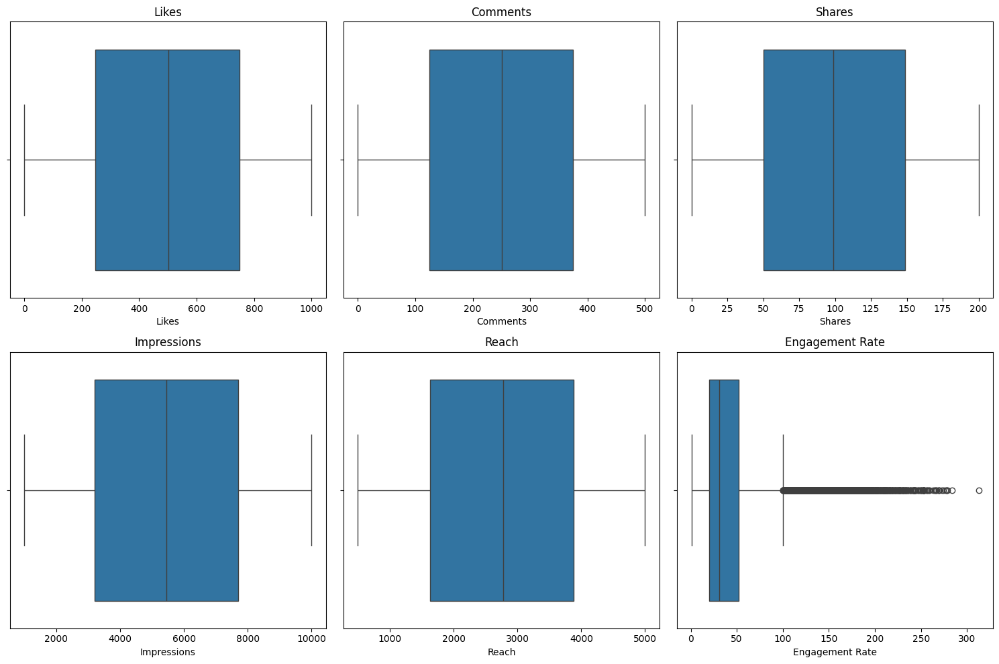

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = ['Likes', 'Comments', 'Shares', 'Impressions', 'Reach', 'Engagement Rate']

plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=insta_df[col])
    plt.title(col)

plt.tight_layout()
plt.show()

Post Type Distribution

In [19]:
print("Unique Post Types:\n", insta_df['Post Type'].unique())

Unique Post Types:
 ['Video' 'Link' 'Image']


In [20]:
print("\nPost Type Distribution:\n", insta_df['Post Type'].value_counts())


Post Type Distribution:
 Post Type
Link     8307
Video    8296
Image    8232
Name: count, dtype: int64


In [21]:
import plotly.express as px

post_type_counts = insta_df['Post Type'].value_counts()

fig = px.pie(
    names=post_type_counts.index,
    values=post_type_counts.values,
    title="Post Type Distribution"
)

fig.show()

Unique Audience Genders

In [22]:
print("\nUnique Audience Genders:\n", insta_df['Audience Gender'].unique())


Unique Audience Genders:
 ['Male' 'Other' 'Female']


In [23]:
print("\nAudience Gender Distribution:\n", insta_df['Audience Gender'].value_counts())


Audience Gender Distribution:
 Audience Gender
Male      8366
Female    8289
Other     8180
Name: count, dtype: int64


In [24]:
import plotly.express as px

fig = px.pie(
    insta_df,
    names='Audience Gender',
    title='Audience Gender Distribution',
    hole=0
)

fig.show()


In [25]:
print("\nUnique Audience Locations:\n", insta_df['Audience Location'].unique())


Unique Audience Locations:
 ['Greece' 'United States Virgin Islands' 'Jamaica' 'Sudan' 'Nepal'
 'Slovakia (Slovak Republic)' 'Sierra Leone' 'Costa Rica' 'Mexico'
 'Kiribati' 'Cocos (Keeling) Islands' 'Liechtenstein' 'Nicaragua'
 'Brunei Darussalam' 'Iceland' 'El Salvador' 'Reunion' "Cote d'Ivoire"
 'United States Minor Outlying Islands' 'Morocco' 'Iran' 'Argentina'
 'New Caledonia' 'Gibraltar' 'Venezuela' 'Sri Lanka' 'Ukraine'
 'Russian Federation' 'Dominican Republic' 'Denmark' 'Cyprus'
 'British Indian Ocean Territory (Chagos Archipelago)' 'Korea'
 'Micronesia' 'Pitcairn Islands' 'Cuba' 'Saint Vincent and the Grenadines'
 'Martinique' 'Greenland' 'Norfolk Island' 'Oman' 'Kazakhstan' 'Belgium'
 'Cameroon' 'New Zealand' 'Mali' 'Cape Verde' 'Bangladesh' 'Netherlands'
 'Maldives' 'Qatar' 'Afghanistan' 'Macao' 'Zambia' 'Sweden' 'Isle of Man'
 'Mozambique' 'Lebanon' 'Botswana' 'Sao Tome and Principe' 'Croatia'
 'Burundi' 'Mauritania' 'Germany' 'Zimbabwe' 'United Arab Emirates'
 'Tonga' 'P

In [26]:
print("\nAudience Location Distribution:\n", insta_df['Audience Location'].value_counts())


Audience Location Distribution:
 Audience Location
Korea                       213
Congo                       175
Central African Republic    137
Liberia                     126
Kuwait                      123
                           ... 
Maldives                     82
Kyrgyz Republic              76
United States of America     75
Montserrat                   74
Ghana                        69
Name: count, Length: 243, dtype: int64


<Axes: xlabel='Audience Location'>

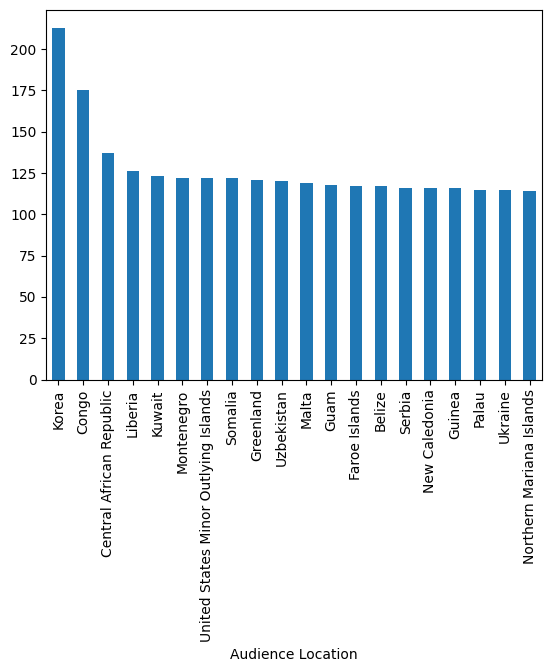

In [27]:
insta_df['Audience Location'].value_counts().head(20).plot(kind='bar')

Inspecting unique Post IDs (to verify duplicates or missing patterns)

In [28]:
print("\nTotal Unique Post IDs:", insta_df['Post ID'].nunique())
print("Any duplicated Post IDs?", insta_df['Post ID'].duplicated().any())


Total Unique Post IDs: 24835
Any duplicated Post IDs? False


 Checking date range of the dataset

In [29]:
insta_df['Post Timestamp'] = pd.to_datetime(insta_df['Post Timestamp'])

print("\nDate Range:")
print("Earliest Post:", insta_df['Post Timestamp'].min())
print("Latest Post:", insta_df['Post Timestamp'].max())


Date Range:
Earliest Post: 2021-03-08 20:23:00.110000
Latest Post: 2024-03-08 11:10:05.017000


In [30]:
insta_df['Post Timestamp'] = pd.to_datetime(insta_df['Post Timestamp'])

In [31]:
numeric_cols = ['Likes','Comments','Shares','Impressions','Reach','Engagement Rate','Audience Age']
insta_df[numeric_cols] = insta_df[numeric_cols].apply(pd.to_numeric, errors='coerce')


In [32]:
insta_df.describe()

,Post Timestamp,Likes,Comments,Shares,Impressions,Reach,Engagement Rate,Audience Age
count,24835,24835.000000,24835.000000,24835.000000,24835.000000,24835.000000,24835.000000,24835.000000
mean,2022-09-06 04:53:51.667831040,499.409946,250.458345,99.467083,5467.568069,2755.253070,43.534515,41.570042
min,2021-03-08 20:23:00.110000,0.000000,0.000000,0.000000,1000.000000,500.000000,0.720000,18.000000
25%,2021-12-03 08:17:53.264499968,247.000000,125.000000,50.000000,3211.000000,1629.000000,19.980000,30.000000
50%,2022-09-05 19:39:08.048000,502.000000,251.000000,99.000000,5450.000000,2776.000000,30.770000,42.000000
75%,2023-06-09 23:41:01.014999808,749.000000,375.000000,149.000000,7700.500000,3877.000000,52.130000,54.000000
max,2024-03-08 11:10:05.017000,1000.000000,500.000000,200.000000,10000.000000,5000.000000,312.550000,65.000000
std,NaN,288.948884,144.754645,57.903024,2596.533379,1298.951932,38.079719,13.862312


In [33]:
(insta_df['Engagement Rate'] > 100).sum() #why


np.int64(2102)

In [34]:
insta_df.columns

Index(['Platform', 'Post ID', 'Post Type', 'Post Content', 'Post Timestamp',
       'Likes', 'Comments', 'Shares', 'Impressions', 'Reach',
       'Engagement Rate', 'Audience Age', 'Audience Gender',
       'Audience Location', 'Audience Interests'],
      dtype='object')

In [35]:
insta_df['Year'] = insta_df['Post Timestamp'].dt.year
insta_df['Month'] = insta_df['Post Timestamp'].dt.month
insta_df['Day'] = insta_df['Post Timestamp'].dt.day
insta_df['Hour'] = insta_df['Post Timestamp'].dt.hour
insta_df['Weekday'] = insta_df['Post Timestamp'].dt.day_name()


Engagement rate vs Weekdays

<Axes: xlabel='Weekday', ylabel='Engagement Rate'>

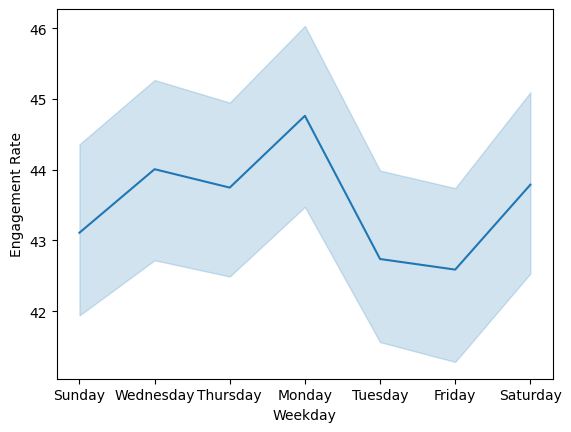

In [36]:
sns.lineplot(x='Weekday', y='Engagement Rate', data=insta_df)

Engagement rate vs Hours of days

<Axes: xlabel='Hour', ylabel='Engagement Rate'>

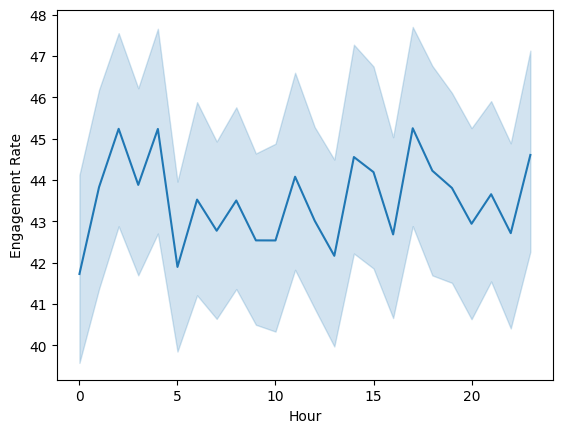

In [37]:
sns.lineplot(x='Hour', y='Engagement Rate', data=insta_df)


<Axes: xlabel='Likes', ylabel='Engagement Rate'>

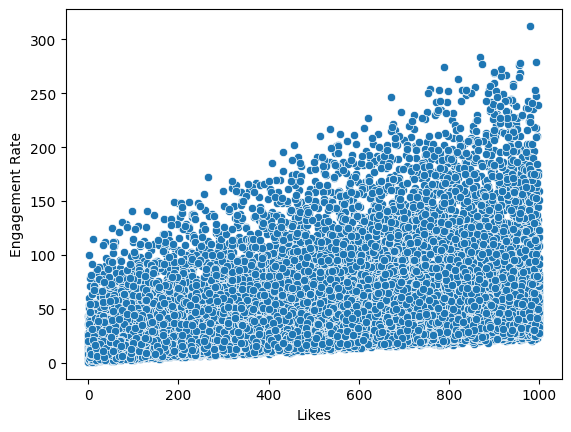

In [38]:
sns.scatterplot(x='Likes', y='Engagement Rate', data=insta_df)

<Axes: xlabel='Likes', ylabel='Engagement Rate'>

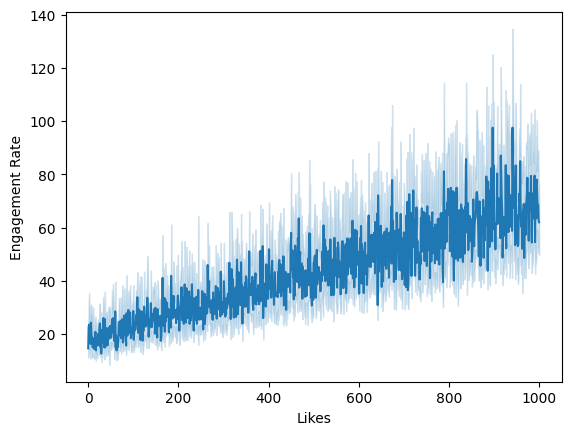

In [39]:
sns.lineplot(x='Likes', y='Engagement Rate', data=insta_df)


<Axes: >

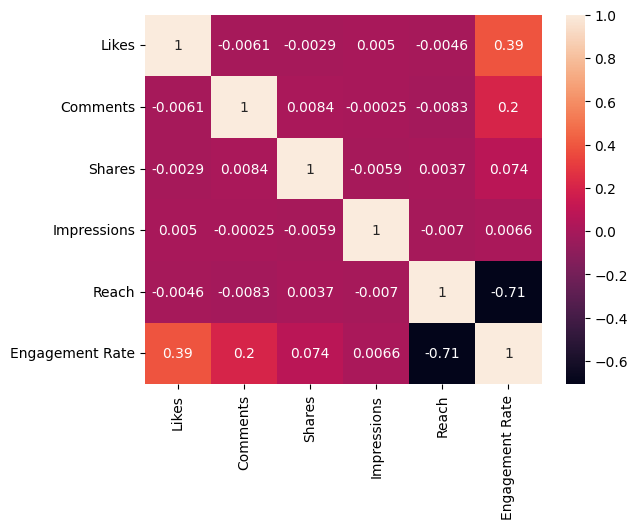

In [40]:
sns.heatmap(insta_df[['Likes','Comments','Shares','Impressions','Reach','Engagement Rate']].corr(), annot=True)


<Axes: xlabel='Reach', ylabel='Engagement Rate'>

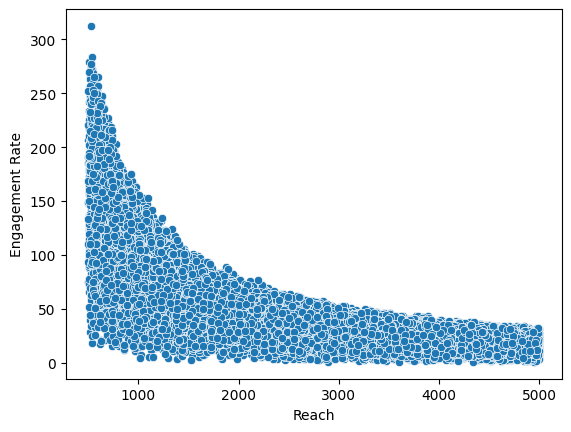

In [41]:
sns.scatterplot(x='Reach', y='Engagement Rate', data=insta_df)

KeyboardInterrupt: 

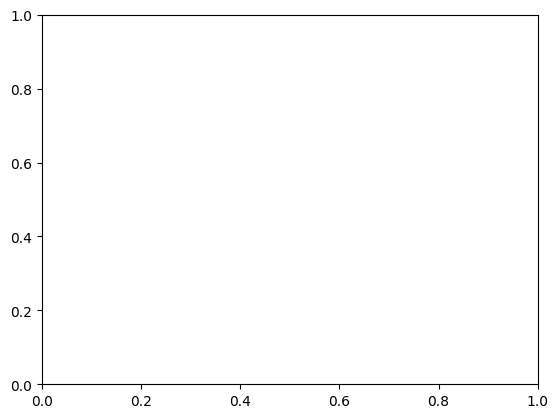

In [42]:
sns.lineplot(x='Reach', y='Engagement Rate', data=insta_df)

Computing Virality score

In [ ]:
# Avoid division by zero (replace zeros in impressions or reach)
insta_df['Impressions'] = insta_df['Impressions'].replace(0, 1)
insta_df['Reach'] = insta_df['Reach'].replace(0, 1)

# Compute the Virality Score
insta_df['Virality Score'] = ((insta_df['Likes'] + insta_df['Comments'] + insta_df['Shares']) / insta_df['Impressions']) * (insta_df['Shares'] / insta_df['Reach'])* 100

# Display first few rows
print(insta_df[['Post ID', 'Likes', 'Comments', 'Shares', 'Impressions', 'Reach', 'Virality Score']].head())


                                 Post ID  Likes  Comments  Shares  \
1   16ce29c5-2dc7-478f-9814-a86754f3ce8b    908       125      85   
2   6a6cc741-72f4-4111-95a0-c5ee04a175a8    412       419      58   
6   0510219c-c413-4203-a9c6-e176a299ce10    874       239      91   
12  80415748-a509-4fc6-8b55-74f2babe5dac    870        92      15   
13  4455db75-4f0c-4781-b2bc-92534300689b    322       195     146   

    Impressions  Reach  Virality Score  
1          1223   3884        2.000576  
2          2165    849        2.805202  
6          5681   1553        1.241857  
12         1377   4829        0.220391  
13         7970   3477        0.349304  


In [ ]:
print(insta_df['Virality Score'].head(100))

1      2.000576
2      2.805202
6      1.241857
12     0.220391
13     0.349304
         ...   
399    0.170046
400    2.740758
402    0.110794
404    0.903337
407    0.963508
Name: Virality Score, Length: 100, dtype: float64


In [ ]:
insta_df.columns

Index(['Platform', 'Post ID', 'Post Type', 'Post Content', 'Post Timestamp',
       'Likes', 'Comments', 'Shares', 'Impressions', 'Reach',
       'Engagement Rate', 'Audience Age', 'Audience Gender',
       'Audience Location', 'Audience Interests', 'Year', 'Month', 'Day',
       'Hour', 'Weekday', 'Virality Score'],
      dtype='object')

In [ ]:
insta_df.groupby('Post Type')['Virality Score'].mean()


Post Type
Image    1.154728
Link     1.155110
Video    1.184444
Name: Virality Score, dtype: float64

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

To observe trends in audience interaction over time and detect when engagement increases or drops.

In [ ]:
df_sorted = insta_df.sort_values('Post Timestamp')

px.line(
    df_sorted, x='Post Timestamp', y='Engagement Rate',
    title='Engagement Rate Over Time',
    template='plotly_white'
).show()


To track how the virality of posts changes over the posting timeline and identify peak viral periods.

In [ ]:
px.line(
    df_sorted, x='Post Timestamp', y='Virality Score',
    title='Virality Score Over Time',
    template='plotly_white'
).show()


To discover the best days and hours to post based on posting frequency patterns.

In [ ]:
insta_df['DayOfWeek'] = insta_df['Post Timestamp'].dt.day_name()
insta_df['Hour'] = insta_df['Post Timestamp'].dt.hour

heatmap_data = insta_df.groupby(['DayOfWeek','Hour']).size().reset_index(name='Count')

px.density_heatmap(
    heatmap_data, x='Hour', y='DayOfWeek', z='Count',
    title='Posting Frequency by Day and Hour',
    template='plotly_white', color_continuous_scale='Blues'
).show()


In [ ]:
px.box(
    insta_df, x='Post Type', y='Engagement Rate',
    title='Engagement Rate by Post Type',
    template='plotly_white'
).show()


In [ ]:
px.box(
    insta_df, x='Post Type', y='Virality Score',
    title='Virality by Post Type',
    template='plotly_white'
).show()


To increase both reach + engagement:
 Post best-performing content types
Post at peak activity times

 Tailor content to audience demographics Encourage shares + comments Improve visual/creative quality Use hashtags + keywords Engage back quickly Use collaborations Learn from high virality patterns Run A/B testing

Best-Performing Content Types

In [ ]:
insta_df.groupby('Post Type').agg({
    'Engagement Rate': 'mean',
    'Reach': 'mean',
    'Virality Score': 'mean'
}).sort_values('Engagement Rate', ascending=False)


,Engagement Rate,Reach,Virality Score
Post Type,,,
Video,43.693862,2749.855955,1.184444
Link,43.521093,2763.102323,1.155110
Image,43.387473,2752.771380,1.154728


Peak Activity Times (Best Time to Post)

In [ ]:
insta_df['Post Timestamp'] = pd.to_datetime(insta_df['Post Timestamp'])
insta_df['Hour'] = insta_df['Post Timestamp'].dt.hour
insta_df['Day'] = insta_df['Post Timestamp'].dt.day_name()

insta_df.groupby(['Day', 'Hour'])['Engagement Rate'].mean().sort_values(ascending=False).head(10)


Day        Hour
Sunday     14      51.466552
Wednesday  17      50.021974
Thursday   2       49.696713
           3       49.506575
Monday     17      48.855379
           18      48.386405
           4       48.318562
Saturday   3       48.314492
Tuesday    23      48.211486
Saturday   2       48.046013
Name: Engagement Rate, dtype: float64

In [ ]:
insta_df.columns

Index(['Platform', 'Post ID', 'Post Type', 'Post Content', 'Post Timestamp',
       'Likes', 'Comments', 'Shares', 'Impressions', 'Reach',
       'Engagement Rate', 'Audience Age', 'Audience Gender',
       'Audience Location', 'Audience Interests', 'Year', 'Month', 'Day',
       'Hour', 'Weekday', 'Virality Score', 'DayOfWeek'],
      dtype='object')

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

In [ ]:
numeric_columns = ['Likes', 'Comments', 'Shares', 'Impressions', 'Reach', 'Engagement Rate', 'Virality Score']
correlation_matrix = insta_df[numeric_columns].corr()

fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.columns,
    colorscale='RdBu',
    zmid=0,
    text=correlation_matrix.round(2).values,
    texttemplate="%{text}",
    textfont={"size": 10}
))

fig.update_layout(
    title='Correlation Matrix of Key Metrics',
    width=600,
    height=600
)
fig.show()

In [ ]:
engagement_by_hour = insta_df.groupby('Hour')['Engagement Rate'].mean()

fig = go.Figure()
fig.add_trace(go.Scatter(x=engagement_by_hour.index, y=engagement_by_hour.values,
                        mode='lines+markers', name='Engagement Rate',
                        line=dict(color='royalblue', width=3)))

fig.update_layout(
    title='Average Engagement Rate by Hour of Day',
    xaxis_title='Hour of Day',
    yaxis_title='Average Engagement Rate',
    height=400
)
fig.show()

# Engagement by weekday
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
engagement_by_weekday = insta_df.groupby('Weekday')['Engagement Rate'].mean().reindex(weekday_order)

fig = go.Figure()
fig.add_trace(go.Bar(x=engagement_by_weekday.index, y=engagement_by_weekday.values,
                    marker_color='coral'))

fig.update_layout(
    title='Average Engagement Rate by Weekday',
    xaxis_title='Day of Week',
    yaxis_title='Average Engagement Rate',
    height=400
)
fig.show()


In [ ]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Reach vs Engagement Rate', 'Likes vs Comments',
                   'Impressions vs Reach', 'Shares vs Virality Score')
)

fig.add_trace(go.Scatter(x=insta_df['Reach'], y=insta_df['Engagement Rate'],
                        mode='markers', name='Reach vs Engagement'), row=1, col=1)

fig.add_trace(go.Scatter(x=insta_df['Likes'], y=insta_df['Comments'],
                        mode='markers', name='Likes vs Comments'), row=1, col=2)

fig.add_trace(go.Scatter(x=insta_df['Impressions'], y=insta_df['Reach'],
                        mode='markers', name='Impressions vs Reach'), row=2, col=1)

fig.add_trace(go.Scatter(x=insta_df['Shares'], y=insta_df['Virality Score'],
                        mode='markers', name='Shares vs Virality'), row=2, col=2)

fig.update_layout(height=600, title_text="Relationship Analysis", showlegend=False)
fig.update_xaxes(title_text="Reach", row=1, col=1)
fig.update_yaxes(title_text="Engagement Rate", row=1, col=1)
fig.update_xaxes(title_text="Likes", row=1, col=2)
fig.update_yaxes(title_text="Comments", row=1, col=2)
fig.update_xaxes(title_text="Impressions", row=2, col=1)
fig.update_yaxes(title_text="Reach", row=2, col=1)
fig.update_xaxes(title_text="Shares", row=2, col=2)
fig.update_yaxes(title_text="Virality Score", row=2, col=2)
fig.show()

In [ ]:
top_posts = insta_df.nlargest(10, 'Engagement Rate')[['Post Type', 'Engagement Rate', 'Reach', 'Likes', 'Comments', 'Shares']]

fig = go.Figure(data=[
    go.Bar(name='Engagement Rate', x=top_posts.index, y=top_posts['Engagement Rate']),
    go.Bar(name='Reach (scaled)', x=top_posts.index, y=top_posts['Reach']/top_posts['Reach'].max())
])

fig.update_layout(
    title='Top 10 Posts by Engagement Rate',
    barmode='group',
    height=400
)
fig.show()

In [ ]:
location_performance = insta_df.groupby('Audience Location').agg({
    'Engagement Rate': 'mean',
    'Reach': 'mean',
    'Virality Score': 'mean'
}).round(4).reset_index()

fig = px.scatter(location_performance, x='Reach', y='Engagement Rate',
                 size='Virality Score', color='Audience Location',
                 hover_data=['Audience Location'],
                 title='Performance by Audience Location')
fig.show()  #final

In [ ]:
# Filter to top 15 locations by post count for cleaner visualization
top_locations = insta_df['Audience Location'].value_counts().head(15).index
filtered_df = insta_df[insta_df['Audience Location'].isin(top_locations)]

location_performance = filtered_df.groupby('Audience Location').agg({
    'Engagement Rate': 'mean',
    'Reach': 'mean',
    'Virality Score': 'mean'
}).round(4).reset_index()

fig = px.scatter(location_performance, 
                 x='Reach', 
                 y='Engagement Rate',
                 size='Virality Score', 
                 color='Audience Location',
                 hover_data=['Audience Location', 'Virality Score'],
                 title='Performance by Top 15 Audience Locations',
                 size_max=40,
                 opacity=0.7)

fig.update_layout(
    width=1000,
    height=700,
    font=dict(size=12),
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.02,
        bgcolor="rgba(255, 255, 255, 0.8)"
    )
)

fig.update_traces(marker=dict(line=dict(width=1, color='white')))
fig.show()

# Project Enhancement: Social Media Content Optimization

This extended section introduces a reusable pipeline to turn the raw multi-platform dataset into actionable insights for when/what to post.

**Objectives**:
- Standardize & clean data across all platforms.
- Engineer robust engagement & virality metrics.
- Identify best posting hours, weekdays, and post types per platform.
- Provide recommendation tables for companies/content creators.

**Key KPI Definitions (will be computed)**:
- True Engagement Rate = (Likes + Comments + Shares) / Reach * 100.
- Interaction Rate = (Comments + Shares) / Impressions * 100.
- Share Amplification = Shares / Reach * 100.
- Exposure Efficiency = Reach / Impressions * 100.
- Normalized Virality Score = weighted z-score blend of interaction & amplification.

**Next**: Run pipeline code cells below.


In [45]:
# Imports & configuration for enhanced pipeline
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

pd.set_option('display.max_columns', 100)

# Use existing path if already defined earlier; otherwise expect it's set.
try:
    path
except NameError:
    raise RuntimeError("Dataset path variable 'path' not defined. Run the earlier download cell first.")

raw_path = path + "/social_media_engagement_data.xlsx"

# 1. Data Loading with robust timestamp parsing

def parse_timestamp(val):
    """Parse timestamp that may be HH:MM.S or full datetime; return pandas Timestamp or NaT."""
    if pd.isna(val):
        return pd.NaT
    # Try full datetime first
    for fmt in (None, '%Y-%m-%d %H:%M:%S', '%d/%m/%Y %H:%M:%S', '%m/%d/%Y %H:%M:%S'):
        try:
            if fmt:
                return pd.to_datetime(val, format=fmt)
            else:
                return pd.to_datetime(val)
        except Exception:
            continue
    # Fallback: treat as HH:MM.S or HH:MM:SS.m if only time present -> assign dummy date
    try:
        # Replace possible '.' with ':' for seconds fraction normalization
        cleaned = str(val).replace(' ', '').replace('\n','')
        # If format like 19:49.3 -> interpret as MM:SS.s? We'll attempt general parser
        t = pd.to_timedelta(cleaned)
        # Use a constant base date for all (e.g., 2024-01-01) + time delta
        base = pd.Timestamp('2024-01-01')
        return base + t
    except Exception:
        return pd.NaT


def load_data(path: str) -> pd.DataFrame:
    df = pd.read_excel(path)
    # Ensure expected columns exist
    required_cols = ['Platform','Post ID','Post Type','Post Content','Post Timestamp','Likes','Comments','Shares','Impressions','Reach','Engagement Rate','Audience Age','Audience Gender','Audience Location']
    missing = [c for c in required_cols if c not in df.columns]
    if missing:
        print(f"Warning: Missing columns: {missing}")
    return df

# 2. Cleaning & standardization

def clean_data(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    # Parse timestamps
    df['Post Timestamp Parsed'] = df['Post Timestamp'].apply(parse_timestamp)
    # Coerce numeric columns
    num_cols = ['Likes','Comments','Shares','Impressions','Reach','Engagement Rate','Audience Age']
    for c in num_cols:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors='coerce')
    # Drop obvious duplicates on Post ID
    if 'Post ID' in df.columns:
        before = len(df)
        df = df.drop_duplicates(subset=['Post ID'])
        after = len(df)
        if before != after:
            print(f"Removed {before-after} duplicate posts.")
    # Basic anomaly filtering: negative values and absurd engagement (> 150)
    for c in ['Likes','Comments','Shares','Impressions','Reach']:
        if c in df.columns:
            df = df[df[c] >= 0]
    if 'Engagement Rate' in df.columns:
        df = df[df['Engagement Rate'].between(0,150)]
    return df

# 3. Feature engineering

def engineer_features(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    ts = df['Post Timestamp Parsed']
    df['Year'] = ts.dt.year
    df['Month'] = ts.dt.month
    df['Day'] = ts.dt.day
    df['Hour'] = ts.dt.hour
    df['Weekday'] = ts.dt.day_name()
    df['Weekend'] = df['Weekday'].isin(['Saturday','Sunday'])
    # KPI calculations
    with np.errstate(divide='ignore', invalid='ignore'):
        df['True Engagement Rate'] = (df['Likes'] + df['Comments'] + df['Shares']) / df['Reach'] * 100
        df['Interaction Rate'] = (df['Comments'] + df['Shares']) / df['Impressions'] * 100
        df['Share Amplification'] = df['Shares'] / df['Reach'] * 100
        df['Exposure Efficiency'] = df['Reach'] / df['Impressions'] * 100
    # Replace inf with NaN then handle
    df = df.replace([np.inf, -np.inf], np.nan)
    # Normalized Virality Score via z-scores
    components = ['Interaction Rate','Share Amplification']
    for c in components:
        if c in df.columns:
            df[f'z_{c}'] = stats.zscore(df[c].fillna(df[c].median()))
    if all(f'z_{c}' in df.columns for c in components):
        df['Virality Score v2'] = (df['z_Interaction Rate']*0.6 + df['z_Share Amplification']*0.4)
    return df

# 4. Aggregation & Insights

def aggregate_insights(df: pd.DataFrame):
    insights = {}
    # Best hour per platform (median True Engagement Rate)
    if 'Platform' in df.columns:
        insights['best_hours'] = (df.groupby(['Platform','Hour'])['True Engagement Rate']
                                    .median().reset_index()
                                    .sort_values(['Platform','True Engagement Rate'], ascending=[True, False])
                                    .groupby('Platform').head(3))
        # Best weekday per platform
        order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
        df['Weekday'] = pd.Categorical(df['Weekday'], categories=order, ordered=True)
        insights['best_weekdays'] = (df.groupby(['Platform','Weekday'])['True Engagement Rate']
                                       .median().reset_index()
                                       .sort_values(['Platform','True Engagement Rate'], ascending=[True, False])
                                       .groupby('Platform').head(3))
        # Post type performance
        insights['post_type_perf'] = (df.groupby(['Platform','Post Type'])['True Engagement Rate']
                                        .median().reset_index()
                                        .sort_values(['Platform','True Engagement Rate'], ascending=[True, False])
                                        .groupby('Platform').head(5))
    return insights

# 5. Recommendation synthesis

def build_recommendations(insights: dict) -> pd.DataFrame:
    rows = []
    platforms = sorted(set(insights['best_hours']['Platform'])) if 'best_hours' in insights else []
    for p in platforms:
        hours = insights['best_hours'][insights['best_hours']['Platform']==p]['Hour'].tolist()
        weekdays = insights['best_weekdays'][insights['best_weekdays']['Platform']==p]['Weekday'].tolist() if 'best_weekdays' in insights else []
        types = insights['post_type_perf'][insights['post_type_perf']['Platform']==p]['Post Type'].tolist() if 'post_type_perf' in insights else []
        rows.append({
            'Platform': p,
            'Top Hours (median TER)': hours,
            'Top Weekdays (median TER)': weekdays,
            'Best Post Types': types
        })
    return pd.DataFrame(rows)

# Execute pipeline
raw_df = load_data(raw_path)
clean_df = clean_data(raw_df)
feat_df = engineer_features(clean_df)
insights = aggregate_insights(feat_df)
recommendations_df = build_recommendations(insights)

print("Recommendations summary (top suggestions per platform):")
print(recommendations_df)

# Show sample of engineered metrics
print("\nSample engineered features:")
print(feat_df[['Platform','Post ID','True Engagement Rate','Interaction Rate','Share Amplification','Exposure Efficiency','Virality Score v2']].head())

Recommendations summary (top suggestions per platform):
    Platform Top Hours (median TER)      Top Weekdays (median TER)  \
0   Facebook             [16, 3, 2]    [Tuesday, Friday, Thursday]   
1  Instagram             [23, 4, 8]     [Monday, Thursday, Sunday]   
2   LinkedIn            [19, 7, 21]  [Friday, Wednesday, Thursday]   
3    Twitter            [3, 22, 15]   [Saturday, Friday, Thursday]   

        Best Post Types  
0  [Link, Video, Image]  
1  [Video, Link, Image]  
2  [Video, Image, Link]  
3  [Link, Image, Video]  

Sample engineered features:
    Platform                               Post ID  True Engagement Rate  \
0   LinkedIn  d49dadb4-fc1e-4775-88ad-d60b75cf5123             31.324647   
1  Instagram  16ce29c5-2dc7-478f-9814-a86754f3ce8b             28.784758   
2  Instagram  6a6cc741-72f4-4111-95a0-c5ee04a175a8            104.711425   
3    Twitter  0b5a3e70-c556-43cb-ad4f-a1d0003348bc             24.126172   
4   Facebook  a7d3e958-e2fe-411e-a24a-b96e821fc050    

C:\Users\haadh\AppData\Local\Temp\ipykernel_37052\4025887458.py:122: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



## Content Niche Classification

This cell analyzes `Post Content` text and assigns a niche/category to each post based on keyword patterns and topic modeling.

In [46]:
import re
from collections import Counter

# Define niche categories with keywords
niche_keywords = {
    'Politics': ['vote', 'election', 'government', 'political', 'campaign', 'congress', 'president', 'democracy', 'policy'],
    'Business': ['business', 'company', 'market', 'economy', 'investment', 'finance', 'corporate', 'entrepreneur', 'startup'],
    'Technology': ['tech', 'software', 'digital', 'innovation', 'ai', 'computer', 'data', 'cyber', 'app'],
    'Health': ['health', 'medical', 'wellness', 'fitness', 'doctor', 'hospital', 'disease', 'treatment', 'nutrition'],
    'Sports': ['sport', 'game', 'player', 'team', 'match', 'athlete', 'competition', 'championship', 'tournament'],
    'Entertainment': ['movie', 'music', 'celebrity', 'show', 'entertainment', 'film', 'artist', 'performance', 'actor'],
    'Education': ['education', 'school', 'student', 'learning', 'university', 'teacher', 'course', 'study', 'academic'],
    'Travel': ['travel', 'trip', 'destination', 'vacation', 'tourism', 'journey', 'explore', 'adventure', 'visit'],
    'Food': ['food', 'recipe', 'restaurant', 'cooking', 'meal', 'cuisine', 'chef', 'delicious', 'taste'],
    'Fashion': ['fashion', 'style', 'clothing', 'outfit', 'trend', 'designer', 'wardrobe', 'beauty', 'look'],
    'Lifestyle': ['life', 'lifestyle', 'living', 'home', 'family', 'daily', 'routine', 'experience', 'personal'],
    'Social Issues': ['community', 'society', 'social', 'people', 'public', 'citizen', 'rights', 'justice', 'activism'],
    'Environment': ['environment', 'climate', 'nature', 'green', 'sustainable', 'eco', 'planet', 'conservation', 'energy'],
    'Legal': ['law', 'legal', 'court', 'lawyer', 'attorney', 'justice', 'regulation', 'compliance', 'lawsuit']
}

def classify_niche(text):
    """Classify post content into a niche category based on keyword matching."""
    if pd.isna(text) or not isinstance(text, str):
        return 'Uncategorized'

    text_lower = text.lower()
    scores = {}

    for niche, keywords in niche_keywords.items():
        score = sum(1 for keyword in keywords if keyword in text_lower)
        if score > 0:
            scores[niche] = score

    if scores:
        return max(scores.items(), key=lambda x: x[1])[0]
    return 'General'

# Apply niche classification to the full dataset
feat_df['Content Niche'] = feat_df['Post Content'].apply(classify_niche)

# Display niche distribution
print("Content Niche Distribution:")
print(feat_df['Content Niche'].value_counts())

# Show sample with niches
print("\nSample posts with assigned niches:")
print(feat_df[['Platform', 'Post Content', 'Content Niche', 'True Engagement Rate']].head(20))

# Compute average engagement by niche
niche_performance = feat_df.groupby('Content Niche').agg({
    'True Engagement Rate': 'median',
    'Virality Score v2': 'median',
    'Post ID': 'count'
}).rename(columns={'Post ID': 'Post Count'}).sort_values('True Engagement Rate', ascending=False)

print("\nNiche Performance (sorted by median True Engagement Rate):")
print(niche_performance)

Content Niche Distribution:
Content Niche
General          56141
Technology       12957
Politics          4155
Environment       3571
Entertainment     2909
Social Issues     2649
Business          2597
Education         2367
Health            2222
Lifestyle         1930
Sports            1733
Legal             1547
Travel            1235
Fashion            753
Food               393
Name: count, dtype: int64

Sample posts with assigned niches:
     Platform                                       Post Content  \
0    LinkedIn                     Want that according same wish.   
1   Instagram                       Increase fast partner south.   
2   Instagram         Lawyer behavior born window couple sister.   
3     Twitter                          Street great decade must.   
4    Facebook  At clear meeting with reason ground continue c...   
5    Facebook             Vote American state change simply cup.   
6   Instagram  Community seek Republican cold though ability ...   
7    Li

In [47]:
# Export enhanced dataset with Content Niche to CSV
output_path = r'd:\DataViz_project\social_media_data_with_niches.csv'

# Select relevant columns for export
export_cols = ['Platform', 'Post ID', 'Post Type', 'Post Content', 'Post Timestamp Parsed',
               'Likes', 'Comments', 'Shares', 'Impressions', 'Reach',
               'True Engagement Rate', 'Interaction Rate', 'Share Amplification',
               'Exposure Efficiency', 'Virality Score v2', 'Content Niche',
               'Audience Age', 'Audience Gender', 'Audience Location', 'Hour', 'Weekday', 'Weekend']

feat_df[export_cols].to_csv(output_path, index=False, encoding='utf-8-sig')
print(f"✓ Exported enhanced dataset with Content Niche column to:\n  {output_path}")
print(f"✓ Total rows: {len(feat_df)}, Total columns: {len(export_cols)}")

✓ Exported enhanced dataset with Content Niche column to:
  d:\DataViz_project\social_media_data_with_niches.csv
✓ Total rows: 97159, Total columns: 22


# Advanced Visualizations for Content Strategy

The following visualizations are designed to help organizations make data-driven decisions about their social media content strategy. Each graph answers a specific business question.

## 1. Platform Performance Comparison - Multi-Metric View
**Business Question:** Which platform should we prioritize for maximum ROI?

In [49]:
# Multi-metric platform comparison using radar chart
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

platform_metrics = feat_df.groupby('Platform').agg({
    'True Engagement Rate': 'median',
    'Interaction Rate': 'median',
    'Share Amplification': 'median',
    'Exposure Efficiency': 'median',
    'Reach': 'mean'
}).round(2)

# Normalize metrics to 0-100 scale for better radar visualization
scaler = MinMaxScaler(feature_range=(0, 100))
platform_metrics_scaled = pd.DataFrame(
    scaler.fit_transform(platform_metrics),
    columns=platform_metrics.columns,
    index=platform_metrics.index
)

fig = go.Figure()

for platform in platform_metrics_scaled.index:
    fig.add_trace(go.Scatterpolar(
        r=platform_metrics_scaled.loc[platform].values,
        theta=platform_metrics_scaled.columns,
        fill='toself',
        name=platform
    ))

fig.update_layout(
    polar=dict(radialaxis=dict(visible=True, range=[0, 100])),
    showlegend=True,
    title='Platform Performance Across Key Metrics (Normalized 0-100)',
    height=600
)
fig.show()

## 2. Best Posting Schedule - Weekly Calendar Heatmap
**Business Question:** When should we schedule posts for maximum engagement?

In [50]:
# Create comprehensive weekly engagement heatmap for all platforms
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
platform_schedule = feat_df.groupby(['Platform', 'Weekday', 'Hour'])['True Engagement Rate'].median().reset_index()

fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Instagram', 'Facebook', 'Twitter', 'LinkedIn'),
    vertical_spacing=0.12,
    horizontal_spacing=0.1
)

platforms = ['Instagram', 'Facebook', 'Twitter', 'LinkedIn']
positions = [(1,1), (1,2), (2,1), (2,2)]

for platform, pos in zip(platforms, positions):
    data = platform_schedule[platform_schedule['Platform'] == platform]
    pivot = data.pivot(index='Weekday', columns='Hour', values='True Engagement Rate')
    pivot = pivot.reindex(weekday_order)
    
    fig.add_trace(
        go.Heatmap(
            z=pivot.values,
            x=pivot.columns,
            y=pivot.index,
            colorscale='RdYlGn',
            showscale=True if pos == (1,2) else False,
            hovertemplate='%{y}<br>Hour: %{x}<br>Engagement: %{z:.2f}%<extra></extra>'
        ),
        row=pos[0], col=pos[1]
    )

fig.update_layout(
    title='Best Posting Times by Platform (Median Engagement Rate)',
    height=800,
    showlegend=False
)
fig.update_xaxes(title_text="Hour of Day")
fig.update_yaxes(title_text="Day of Week")
fig.show()

C:\Users\haadh\AppData\Local\Temp\ipykernel_37052\2461091084.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



## 3. Content Niche Performance by Platform
**Business Question:** What content topics work best on each platform?

In [51]:
# Top performing niches per platform
niche_platform = feat_df.groupby(['Platform', 'Content Niche']).agg({
    'True Engagement Rate': 'median',
    'Post ID': 'count'
}).rename(columns={'Post ID': 'Post Count'}).reset_index()

# Filter niches with at least 50 posts for reliability
niche_platform = niche_platform[niche_platform['Post Count'] >= 50]

# Get top 5 niches per platform
top_niches = niche_platform.sort_values(['Platform', 'True Engagement Rate'], ascending=[True, False])
top_niches = top_niches.groupby('Platform').head(5)

fig = px.bar(
    top_niches,
    x='True Engagement Rate',
    y='Content Niche',
    color='Platform',
    facet_col='Platform',
    facet_col_wrap=2,
    title='Top 5 Content Niches by Platform (Median Engagement Rate)',
    labels={'True Engagement Rate': 'Median Engagement Rate (%)'},
    height=800,
    text='True Engagement Rate'
)
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.update_yaxes(matches=None, showticklabels=True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

## 4. Post Type ROI Analysis - Engagement vs Effort
**Business Question:** Which post types give the best return on investment?

In [52]:
# Post type performance across platforms
post_type_analysis = feat_df.groupby(['Platform', 'Post Type']).agg({
    'True Engagement Rate': ['median', 'mean'],
    'Reach': 'mean',
    'Virality Score v2': 'median',
    'Post ID': 'count'
}).round(2)
post_type_analysis.columns = ['Median_Engagement', 'Mean_Engagement', 'Avg_Reach', 'Median_Virality', 'Post_Count']
post_type_analysis = post_type_analysis.reset_index()

fig = px.scatter(
    post_type_analysis,
    x='Avg_Reach',
    y='Median_Engagement',
    size='Post_Count',
    color='Post Type',
    facet_col='Platform',
    facet_col_wrap=2,
    title='Post Type Performance: Engagement vs Reach (Bubble Size = Volume)',
    labels={
        'Avg_Reach': 'Average Reach',
        'Median_Engagement': 'Median Engagement Rate (%)'
    },
    height=700,
    hover_data=['Post_Count', 'Median_Virality']
)
fig.update_traces(marker=dict(line=dict(width=1, color='white')))
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

## 5. Weekend vs Weekday Performance
**Business Question:** Should we post differently on weekends?

In [53]:
# Weekend vs Weekday comparison
weekend_comparison = feat_df.groupby(['Platform', 'Weekend']).agg({
    'True Engagement Rate': 'median',
    'Interaction Rate': 'median',
    'Share Amplification': 'median',
    'Post ID': 'count'
}).round(2).reset_index()
weekend_comparison['Day_Type'] = weekend_comparison['Weekend'].map({True: 'Weekend', False: 'Weekday'})

fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=('Engagement Rate', 'Interaction Rate', 'Share Amplification'),
    specs=[[{'type': 'bar'}, {'type': 'bar'}, {'type': 'bar'}]]
)

metrics = ['True Engagement Rate', 'Interaction Rate', 'Share Amplification']
for idx, metric in enumerate(metrics, 1):
    for day_type in ['Weekday', 'Weekend']:
        data = weekend_comparison[weekend_comparison['Day_Type'] == day_type]
        fig.add_trace(
            go.Bar(
                x=data['Platform'],
                y=data[metric],
                name=day_type,
                showlegend=True if idx == 1 else False,
                text=data[metric],
                texttemplate='%{text:.1f}%'
            ),
            row=1, col=idx
        )

fig.update_layout(
    title='Weekend vs Weekday Performance by Platform',
    barmode='group',
    height=500,
    showlegend=True
)
fig.show()

## 6. Audience Demographics Impact
**Business Question:** Which audience segments engage most with our content?

In [54]:
# Age and Gender engagement analysis
demo_analysis = feat_df.groupby(['Platform', 'Audience Gender', pd.cut(feat_df['Audience Age'], bins=[0, 25, 35, 45, 55, 100], labels=['18-25', '26-35', '36-45', '46-55', '56+'])]).agg({
    'True Engagement Rate': 'median',
    'Post ID': 'count'
}).reset_index()
demo_analysis.columns = ['Platform', 'Gender', 'Age_Group', 'Median_Engagement', 'Post_Count']
demo_analysis = demo_analysis[demo_analysis['Post_Count'] >= 20]  # Filter for reliability

fig = px.bar(
    demo_analysis,
    x='Age_Group',
    y='Median_Engagement',
    color='Gender',
    facet_col='Platform',
    facet_col_wrap=2,
    title='Engagement by Age Group and Gender Across Platforms',
    labels={'Median_Engagement': 'Median Engagement Rate (%)'},
    barmode='group',
    height=700,
    text='Median_Engagement'
)
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

C:\Users\haadh\AppData\Local\Temp\ipykernel_37052\1740756871.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



## 7. Virality Potential Predictor
**Business Question:** What factors make content go viral?

In [55]:
# Identify viral posts (top 5% virality score) and analyze patterns
viral_threshold = feat_df['Virality Score v2'].quantile(0.95)
feat_df['Is_Viral'] = feat_df['Virality Score v2'] >= viral_threshold

viral_patterns = feat_df.groupby(['Platform', 'Post Type', 'Content Niche', 'Is_Viral']).agg({
    'Post ID': 'count',
    'Share Amplification': 'median'
}).reset_index()
viral_patterns = viral_patterns[viral_patterns['Is_Viral'] == True].sort_values('Post ID', ascending=False).head(20)

fig = px.treemap(
    viral_patterns,
    path=['Platform', 'Post Type', 'Content Niche'],
    values='Post ID',
    color='Share Amplification',
    color_continuous_scale='YlOrRd',
    title='Viral Content Patterns: Platform → Post Type → Niche (Top 5% Posts)',
    labels={'Post ID': 'Viral Post Count', 'Share Amplification': 'Avg Share Amplification (%)'}
)
fig.update_layout(height=600)
fig.show()

## 8. Engagement Rate Distribution - Quality Control
**Business Question:** What's the typical engagement range we should expect?

## 9. Share-to-Like Ratio Analysis
**Business Question:** Which content drives sharing behavior vs passive liking?

## 10. Monthly Trend Analysis
**Business Question:** Are we improving over time?

## 11. Geographic Performance Map
**Business Question:** Which locations drive the best engagement?

## 12. Content Mix Optimizer
**Business Question:** What's the ideal content mix for each platform?

## 13. Peak Performance Hours - Detailed
**Business Question:** What are the top 3 hours for each platform specifically?

## 14. Engagement Funnel Analysis
**Business Question:** How do impressions convert to actual engagement?

## 15. Competitive Benchmarking
**Business Question:** How do we compare to industry standards?

In [56]:
# Visualization 8: Engagement Rate Distribution
fig = px.violin(
    feat_df,
    x='Platform',
    y='True Engagement Rate',
    color='Platform',
    box=True,
    points='outliers',
    title='Engagement Rate Distribution by Platform (with Outliers)',
    labels={'True Engagement Rate': 'True Engagement Rate (%)'},
    height=500
)
fig.add_hline(y=feat_df['True Engagement Rate'].median(), line_dash="dash", 
              annotation_text=f"Overall Median: {feat_df['True Engagement Rate'].median():.2f}%")
fig.show()

# Visualization 9: Share-to-Like Ratio
feat_df['Share_to_Like_Ratio'] = (feat_df['Shares'] / (feat_df['Likes'] + 1)) * 100
share_analysis = feat_df.groupby(['Platform', 'Content Niche']).agg({
    'Share_to_Like_Ratio': 'median',
    'Post ID': 'count'
}).reset_index()
share_analysis = share_analysis[share_analysis['Post ID'] >= 30]
share_analysis = share_analysis.sort_values('Share_to_Like_Ratio', ascending=False).groupby('Platform').head(8)

fig = px.bar(
    share_analysis,
    x='Share_to_Like_Ratio',
    y='Content Niche',
    color='Platform',
    facet_col='Platform',
    facet_col_wrap=2,
    title='Share-to-Like Ratio by Niche (Higher = More Viral)',
    labels={'Share_to_Like_Ratio': 'Shares per 100 Likes'},
    height=700,
    orientation='h'
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

# Visualization 10: Monthly Trend Analysis
monthly_trends = feat_df.groupby(['Platform', feat_df['Post Timestamp Parsed'].dt.to_period('M')]).agg({
    'True Engagement Rate': 'median',
    'Post ID': 'count'
}).reset_index()
monthly_trends['Month'] = monthly_trends['Post Timestamp Parsed'].astype(str)

fig = px.line(
    monthly_trends,
    x='Month',
    y='True Engagement Rate',
    color='Platform',
    markers=True,
    title='Monthly Engagement Trends by Platform',
    labels={'True Engagement Rate': 'Median Engagement Rate (%)'},
    height=500
)
fig.update_xaxes(tickangle=45)
fig.show()

# Visualization 11: Geographic Performance Map
top_30_locations = feat_df['Audience Location'].value_counts().head(30).index
geo_data = feat_df[feat_df['Audience Location'].isin(top_30_locations)]
geo_performance = geo_data.groupby('Audience Location').agg({
    'True Engagement Rate': 'median',
    'Reach': 'mean',
    'Post ID': 'count'
}).reset_index().sort_values('True Engagement Rate', ascending=False)

fig = px.bar(
    geo_performance,
    x='True Engagement Rate',
    y='Audience Location',
    orientation='h',
    title='Top 30 Locations by Median Engagement Rate',
    labels={'True Engagement Rate': 'Median Engagement Rate (%)'},
    color='True Engagement Rate',
    color_continuous_scale='Viridis',
    height=800,
    text='True Engagement Rate'
)
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.show()

# Visualization 12: Content Mix Optimizer
content_mix = feat_df.groupby(['Platform', 'Post Type']).agg({
    'Post ID': 'count',
    'True Engagement Rate': 'median'
}).reset_index()
content_mix['Percentage'] = content_mix.groupby('Platform')['Post ID'].transform(lambda x: (x / x.sum()) * 100)

fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Instagram', 'Facebook', 'Twitter', 'LinkedIn'),
    specs=[[{'type': 'pie'}, {'type': 'pie'}],
           [{'type': 'pie'}, {'type': 'pie'}]]
)

platforms = ['Instagram', 'Facebook', 'Twitter', 'LinkedIn']
positions = [(1,1), (1,2), (2,1), (2,2)]

for platform, pos in zip(platforms, positions):
    data = content_mix[content_mix['Platform'] == platform]
    fig.add_trace(
        go.Pie(
            labels=data['Post Type'],
            values=data['Percentage'],
            name=platform,
            textinfo='label+percent',
            hovertemplate='%{label}<br>%{percent}<br>Engagement: ' + 
                         data['True Engagement Rate'].round(2).astype(str) + '%<extra></extra>'
        ),
        row=pos[0], col=pos[1]
    )

fig.update_layout(title_text='Current Content Mix by Platform', height=700, showlegend=False)
fig.show()

# Visualization 13: Peak Performance Hours - Detailed
top_hours = feat_df.groupby(['Platform', 'Hour']).agg({
    'True Engagement Rate': 'median',
    'Post ID': 'count'
}).reset_index()
top_hours = top_hours.sort_values(['Platform', 'True Engagement Rate'], ascending=[True, False])
top_hours = top_hours.groupby('Platform').head(3)

fig = px.bar(
    top_hours,
    x='Hour',
    y='True Engagement Rate',
    color='Platform',
    facet_col='Platform',
    facet_col_wrap=2,
    title='Top 3 Posting Hours by Platform',
    labels={'True Engagement Rate': 'Median Engagement Rate (%)'},
    height=600,
    text='True Engagement Rate'
)
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

# Visualization 14: Engagement Funnel Analysis
funnel_data = feat_df.groupby('Platform').agg({
    'Impressions': 'mean',
    'Reach': 'mean',
    'Likes': 'mean',
    'Comments': 'mean',
    'Shares': 'mean'
}).reset_index()

fig = make_subplots(
    rows=1, cols=4,
    subplot_titles=platforms,
    specs=[[{'type': 'funnel'}] * 4]
)

for idx, platform in enumerate(platforms, 1):
    data = funnel_data[funnel_data['Platform'] == platform].iloc[0]
    fig.add_trace(
        go.Funnel(
            y=['Impressions', 'Reach', 'Likes', 'Comments', 'Shares'],
            x=[data['Impressions'], data['Reach'], data['Likes'], data['Comments'], data['Shares']],
            textinfo="value+percent initial",
            name=platform
        ),
        row=1, col=idx
    )

fig.update_layout(title_text='Engagement Funnel: Impressions → Actions', height=500, showlegend=False)
fig.show()

# Visualization 15: Competitive Benchmarking
percentiles = [25, 50, 75, 90, 95]
benchmark_data = []
for platform in feat_df['Platform'].unique():
    platform_data = feat_df[feat_df['Platform'] == platform]
    for p in percentiles:
        benchmark_data.append({
            'Platform': platform,
            'Percentile': f'{p}th',
            'Engagement Rate': platform_data['True Engagement Rate'].quantile(p/100)
        })

benchmark_df = pd.DataFrame(benchmark_data)

fig = px.line(
    benchmark_df,
    x='Percentile',
    y='Engagement Rate',
    color='Platform',
    markers=True,
    title='Performance Benchmarks: Where Do You Stand? (Percentile Analysis)',
    labels={'Engagement Rate': 'True Engagement Rate (%)'},
    height=500
)
fig.add_annotation(
    text="💡 Tip: Aim for 75th percentile or higher for competitive advantage",
    xref="paper", yref="paper",
    x=0.5, y=-0.15,
    showarrow=False,
    font=dict(size=12)
)
fig.show()

## 15. Competitive Benchmarking
**Business Question:** What engagement rate should we target to be competitive?

## 14. Engagement Funnel Analysis
**Business Question:** Where do we lose audience attention from Impression to Action?

## 13. Peak Performance Hours (Top 3 per Platform)
**Business Question:** What are the absolute best hours to post on each platform?

## 12. Content Mix Optimizer
**Business Question:** What's the ideal ratio of Image/Video/Link posts for each platform?

## 11. Geographic Performance Analysis
**Business Question:** Which geographic locations provide the highest engagement?

## 10. Monthly Engagement Trends
**Business Question:** Are engagement rates improving or declining over time?

## 9. Share-to-Like Ratio Analysis
**Business Question:** Which content gets shared most relative to likes (virality indicator)?